In [1]:
import json
from matplotlib import pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import pandas as pd
from IPython.display import display

TASKS = ['topic', 'format', 'age_group']

In [2]:
path = "results/history_RoBERT-base_finetune_all_tasks_256_config_0.0001_3e-06_4_5000000_0.8.json"

In [3]:
with open(path, "r") as f:
    data = json.load(f)

train_loss = data["train_loss"]
val_loss = data["val_loss"]

train_reg_loss = data["train_reg_loss"]
val_reg_loss = data["val_reg_loss"]

train_reg_rmse = data["train_reg_rmse"]
val_reg_rmse = data["val_reg_rmse"]

train_reg_mae = data["train_reg_mae"]
val_reg_mae = data["val_reg_mae"]

train_reg_pearson = data["train_reg_pearson"]
val_reg_pearson = data["val_reg_pearson"]

train_reg_spearman = data["train_reg_spearman"]
val_reg_spearman = data["val_reg_spearman"]

train_reg_f1_macro = data["train_reg_f1_macro"]
val_reg_f1_macro = data["val_reg_f1_macro"]

train_reg_f1_weighted = data["train_reg_f1_weighted"]
val_reg_f1_weighted = data["val_reg_f1_weighted"]

train_reg_confusion_matrix = data["train_reg_confusion_matrix"]
val_reg_confusion_matrix = data["val_reg_confusion_matrix"]

train_reg_classification_report = data["train_reg_classification_report"]
val_reg_classification_report = data["val_reg_classification_report"]

train_classes_loss = data["train_classes_loss"]
val_classes_loss = data["val_classes_loss"]

train_classes_f1_macro = data["train_classes_f1_macro"]
val_classes_f1_macro = data["val_classes_f1_macro"]

train_classes_f1_weighted = data["train_classes_f1_weighted"]
val_classes_f1_weighted = data["val_classes_f1_weighted"]

train_classes_confusion_matrix = data["train_classes_confusion_matrix"]
val_classes_confusion_matrix = data["val_classes_confusion_matrix"]

train_classes_classification_report = data["train_classes_classification_report"]
val_classes_classification_report = data["val_classes_classification_report"]

epochs = list(range(len(val_loss)))

In [4]:
fig = go.Figure()

# Plot all losses together
fig.add_trace(go.Scatter(x=epochs, y=train_loss, mode='lines+markers', name='Train Loss'))
fig.add_trace(go.Scatter(x=epochs, y=val_loss, mode='lines+markers', name='Val Loss'))
fig.add_trace(go.Scatter(x=epochs, y=train_reg_loss, mode='lines+markers', name='Train Reg Loss'))
fig.add_trace(go.Scatter(x=epochs, y=val_reg_loss, mode='lines+markers', name='Val Reg Loss'))

# Task Losses
for t in TASKS:
    fig.add_trace(go.Scatter(x=epochs, y=[d[t] for d in train_classes_loss], mode='lines+markers', name=f"Train {t}"))
    fig.add_trace(go.Scatter(x=epochs, y=[d[t] for d in val_classes_loss], mode='lines+markers', name=f"Val {t}"))

fig.update_layout(width=1200, height=600)
fig.show()

In [5]:
fig = make_subplots(rows=2, cols=3, subplot_titles=("Loss", "RMSE", "MAE", "Pearson", "Spearman", "F1 Scores"))

# Loss
fig.add_trace(go.Scatter(x=epochs, y=train_reg_loss, mode='lines+markers', name='Train Loss'), row=1, col=1)
fig.add_trace(go.Scatter(x=epochs, y=val_reg_loss, mode='lines+markers', name='Val Loss'), row=1, col=1)

# RMSE
fig.add_trace(go.Scatter(x=epochs, y=train_reg_rmse, mode='lines+markers', name='Train RMSE'), row=1, col=2)
fig.add_trace(go.Scatter(x=epochs, y=val_reg_rmse, mode='lines+markers', name='Val RMSE'), row=1, col=2)

# MAE
fig.add_trace(go.Scatter(x=epochs, y=train_reg_mae, mode='lines+markers', name='Train MAE'), row=1, col=3)
fig.add_trace(go.Scatter(x=epochs, y=val_reg_mae, mode='lines+markers', name='Val MAE'), row=1, col=3)

# Pearson
fig.add_trace(go.Scatter(x=epochs, y=train_reg_pearson, mode='lines+markers', name='Train Pearson'), row=2, col=1)
fig.add_trace(go.Scatter(x=epochs, y=val_reg_pearson, mode='lines+markers', name='Val Pearson'), row=2, col=1)

# Spearman
fig.add_trace(go.Scatter(x=epochs, y=train_reg_spearman, mode='lines+markers', name='Train Spearman'), row=2, col=2)
fig.add_trace(go.Scatter(x=epochs, y=val_reg_spearman, mode='lines+markers', name='Val Spearman'), row=2, col=2)

# F1 Scores
fig.add_trace(go.Scatter(x=epochs, y=train_reg_f1_macro, mode='lines+markers', name='Train F1 Macro'), row=2, col=3)
fig.add_trace(go.Scatter(x=epochs, y=val_reg_f1_macro, mode='lines+markers', name='Val F1 Macro'), row=2, col=3)
fig.add_trace(go.Scatter(x=epochs, y=train_reg_f1_weighted, mode='lines+markers', name='Train F1 Weighted'), row=2, col=3)
fig.add_trace(go.Scatter(x=epochs, y=val_reg_f1_weighted, mode='lines+markers', name='Val F1 Weighted'), row=2, col=3)

fig.update_layout(title="Regression Metrics with Plotly", xaxis_title="Epochs")
fig.show()

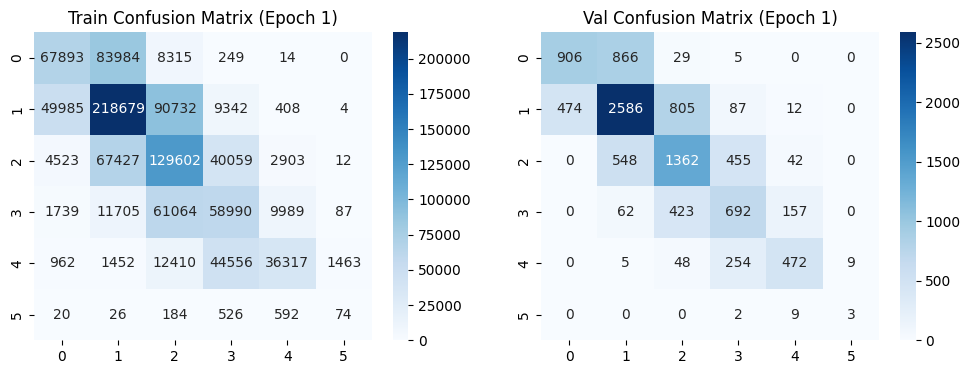

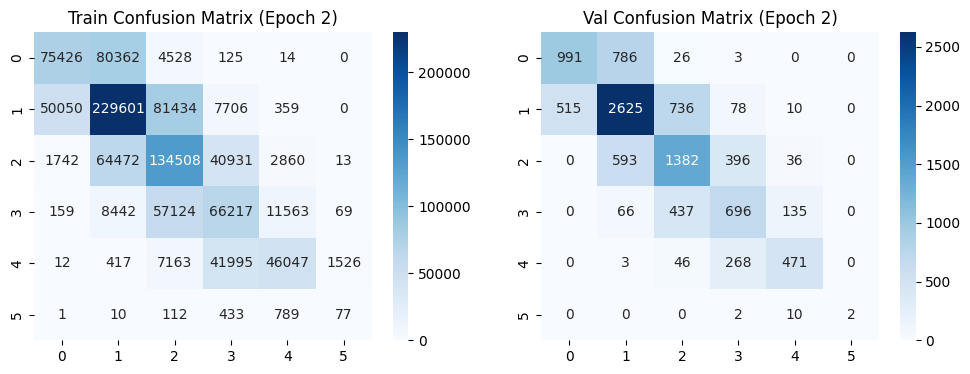

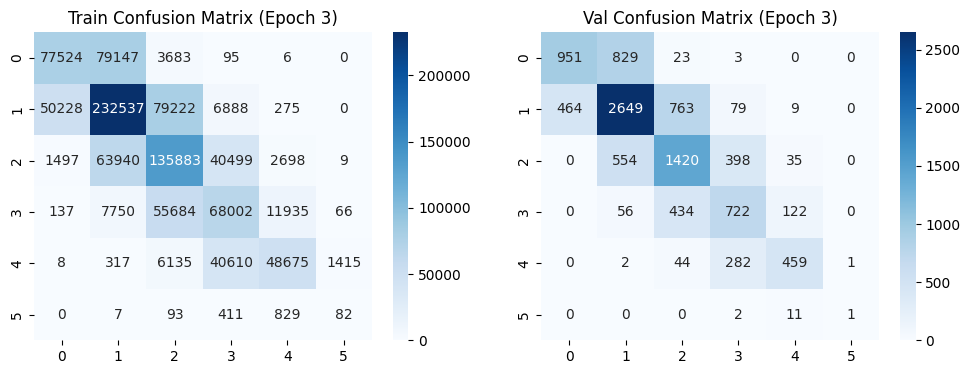

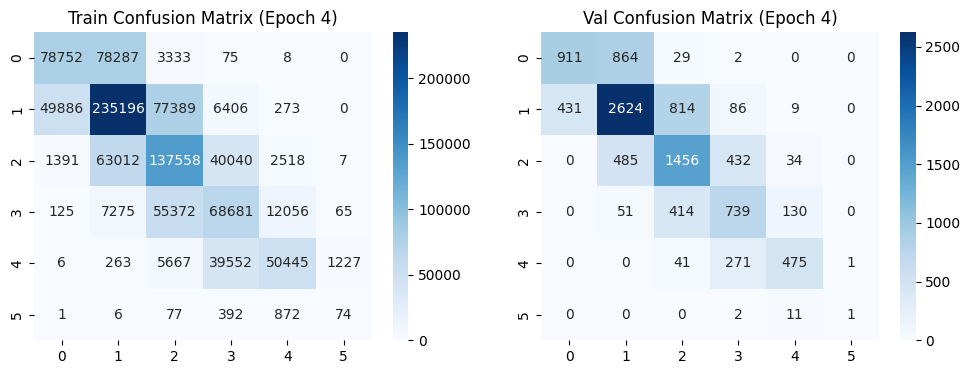

In [6]:
for i, (train_cm, val_cm) in enumerate(zip(train_reg_confusion_matrix, val_reg_confusion_matrix)):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    sns.heatmap(train_cm, annot=True, cmap="Blues", ax=axes[0], fmt='g')
    axes[0].set_title(f"Train Confusion Matrix (Epoch {i+1})")
    sns.heatmap(val_cm, annot=True, cmap="Blues", ax=axes[1], fmt='g')
    axes[1].set_title(f"Val Confusion Matrix (Epoch {i+1})")
    plt.show()

In [7]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("Loss", "F1 Macro", "F1 Weighted"))

# Loss
for t in TASKS:
    fig.add_trace(
        go.Scatter(
            x=epochs, 
            y=[d[t] for d in train_classes_loss], 
            mode="lines+markers", 
            name=f"Train {t}"
        ),
        row=1,
        col=1
    )
    fig.add_trace(
        go.Scatter(
            x=epochs, 
            y=[d[t] for d in val_classes_loss], 
            mode="lines+markers", 
            name=f"Val {t}"
        ),
        row=1,
        col=1
    )

# F1 Macro
for t in TASKS:
    fig.add_trace(
        go.Scatter(
            x=epochs, 
            y=[d[t] for d in train_classes_f1_macro], 
            mode="lines+markers", 
            name=f"Train {t}"
        ),
        row=1,
        col=2
    )
    fig.add_trace(
        go.Scatter(
            x=epochs, 
            y=[d[t] for d in val_classes_f1_macro], 
            mode="lines+markers", 
            name=f"Val {t}"
        ),
        row=1,
        col=2
    )

# F1 Weighted
for t in TASKS:
    fig.add_trace(
        go.Scatter(
            x=epochs, 
            y=[d[t] for d in train_classes_f1_weighted], 
            mode="lines+markers", 
            name=f"Train {t}"
        ),
        row=1,
        col=3
    )
    fig.add_trace(
        go.Scatter(
            x=epochs, 
            y=[d[t] for d in val_classes_f1_weighted], 
            mode="lines+markers", 
            name=f"Val {t}"
        ),
        row=1,
        col=3
    )

fig.update_layout(width=1200, height=600)
fig.show()

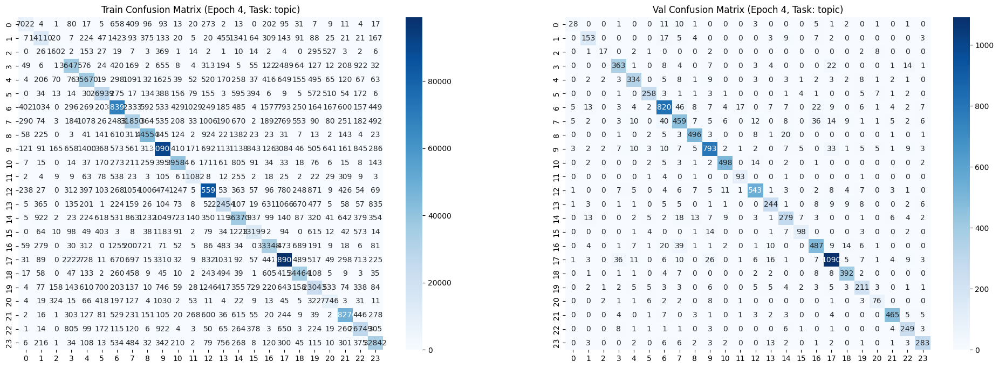

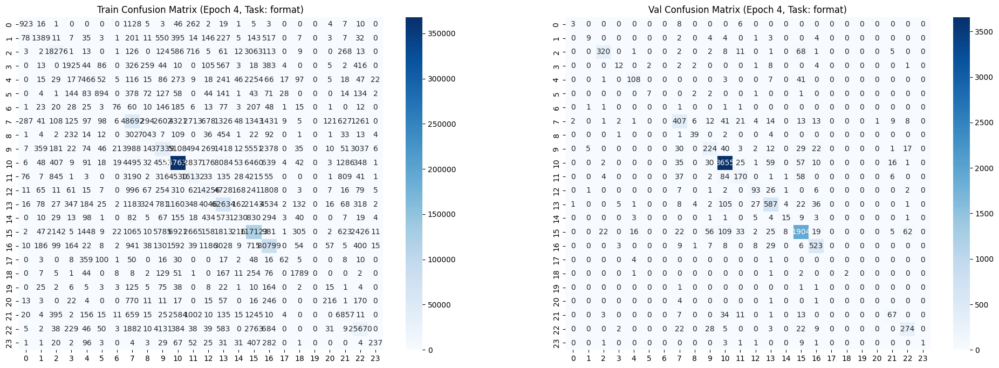

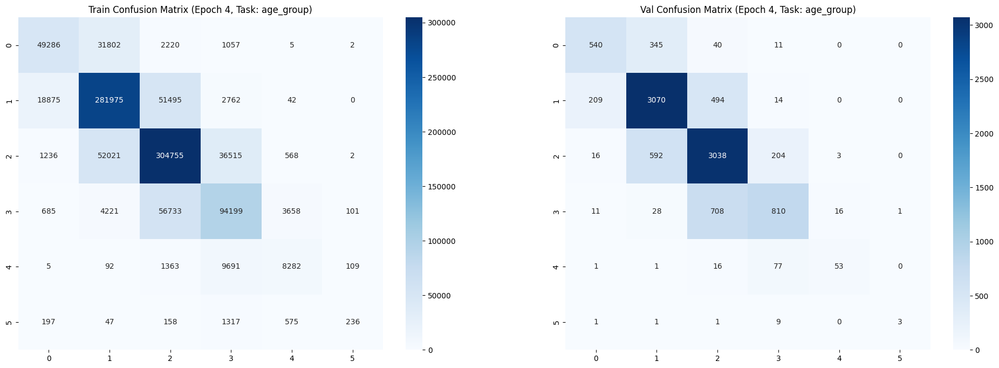

In [8]:
for epoch_idx in [len(train_classes_confusion_matrix) - 1]:
    for task_name in TASKS:
        train_cm = train_classes_confusion_matrix[epoch_idx][task_name]
        val_cm = val_classes_confusion_matrix[epoch_idx][task_name]

        fig_, axes_ = plt.subplots(1, 2, figsize=(24, 8))
        sns.heatmap(train_cm, annot=True, cmap="Blues", ax=axes_[0], fmt='g')
        axes_[0].set_title(f"Train Confusion Matrix (Epoch {epoch_idx + 1}, Task: {task_name})")
        sns.heatmap(val_cm, annot=True, cmap="Blues", ax=axes_[1], fmt='g')
        axes_[1].set_title(f"Val Confusion Matrix (Epoch {epoch_idx + 1}, Task: {task_name})")
        plt.show()

In [9]:
for epoch in [len(train_reg_classification_report) - 1]:
    print(f"=== Epoch {epoch+1} ===\n")
    print("Train Regression Classification Report:")
    display(pd.DataFrame(train_reg_classification_report[epoch]).T)

    print("\nVal Regression Classification Report:")
    display(pd.DataFrame(val_reg_classification_report[epoch]).T)

    for t in TASKS:
        print(f"\nTrain {t} Classification Report:")
        display(pd.DataFrame(train_classes_classification_report[epoch][t]).T)

        print(f"\nVal {t} Classification Report:")
        display(pd.DataFrame(val_classes_classification_report[epoch][t]).T)

    print("\n" + "="*40 + "\n")

=== Epoch 4 ===

Train Regression Classification Report:


,precision,recall,f1-score,support
0,0.605035,0.490804,0.541966,1.604550e+05
1,0.612427,0.637129,0.624534,3.691500e+05
2,0.492341,0.562550,0.525109,2.445260e+05
3,0.442686,0.478367,0.459835,1.435740e+05
4,0.762331,0.519195,0.617699,9.716000e+04
5,0.053897,0.052039,0.052952,1.422000e+03
accuracy,0.561560,0.561560,0.561560,5.615599e-01
macro avg,0.494786,0.456681,0.470349,1.016287e+06
weighted avg,0.571936,0.561560,0.562855,1.016287e+06



Val Regression Classification Report:


,precision,recall,f1-score,support
0,0.678838,0.504430,0.578780,1806.000000
1,0.652087,0.661958,0.656985,3964.000000
2,0.528686,0.604902,0.564232,2407.000000
3,0.482376,0.553973,0.515701,1334.000000
4,0.720789,0.602792,0.656531,788.000000
5,0.500000,0.071429,0.125000,14.000000
accuracy,0.601765,0.601765,0.601765,0.601765
macro avg,0.593796,0.499914,0.516205,10313.000000
weighted avg,0.611061,0.601765,0.602610,10313.000000



Train topic Classification Report:


,precision,recall,f1-score,support
0,0.842573,0.773178,0.806385,9.082000e+03
1,0.784979,0.734552,0.758929,1.920900e+04
2,0.673109,0.518614,0.585848,3.089000e+03
3,0.868763,0.859611,0.864162,4.243200e+04
4,0.847027,0.845321,0.846173,4.219700e+04
5,0.881252,0.881512,0.881382,3.056000e+04
6,0.846951,0.848622,0.847786,8.059300e+04
7,0.733533,0.735481,0.734506,4.330500e+04
8,0.904154,0.909061,0.906601,4.901100e+04
9,0.861973,0.872279,0.867095,1.042190e+05



Val topic Classification Report:


,precision,recall,f1-score,support
0,0.636364,0.437500,0.518519,64.000000
1,0.750000,0.753695,0.751843,203.000000
2,0.708333,0.515152,0.596491,33.000000
3,0.819413,0.848131,0.833525,428.000000
4,0.839196,0.856410,0.847716,390.000000
5,0.883562,0.892734,0.888124,289.000000
6,0.829960,0.824950,0.827447,994.000000
7,0.713841,0.727417,0.720565,631.000000
8,0.898551,0.916821,0.907594,541.000000
9,0.875276,0.865721,0.870472,916.000000



Train format Classification Report:


,precision,recall,f1-score,support
0,0.632192,0.379055,0.473941,2.435000e+03
1,0.590561,0.367266,0.452886,3.782000e+03
2,0.806923,0.781293,0.793901,2.339200e+04
3,0.571047,0.457245,0.507849,4.210000e+03
4,0.716369,0.684075,0.699850,1.091400e+04
5,0.623866,0.399285,0.486928,2.239000e+03
6,0.419890,0.079167,0.133216,9.600000e+02
7,0.688061,0.735162,0.710832,6.623300e+04
8,0.854008,0.840153,0.847023,8.383000e+03
9,0.638263,0.617991,0.627963,6.042000e+04



Val format Classification Report:


,precision,recall,f1-score,support
0,0.500000,0.176471,0.260870,17.000000
1,0.562500,0.333333,0.418605,27.000000
2,0.901408,0.763723,0.826873,419.000000
3,0.480000,0.375000,0.421053,32.000000
4,0.800000,0.675000,0.732203,160.000000
5,0.777778,0.538462,0.636364,13.000000
6,0.000000,0.000000,0.000000,5.000000
7,0.672727,0.733333,0.701724,555.000000
8,0.722222,0.829787,0.772277,47.000000
9,0.603774,0.581818,0.592593,385.000000



Train age_group Classification Report:


,precision,recall,f1-score,support
0,0.701241,0.584151,0.637363,8.437200e+04
1,0.761769,0.793963,0.777533,3.551490e+05
2,0.731311,0.771342,0.750794,3.950970e+05
3,0.647233,0.590230,0.617419,1.595970e+05
4,0.630769,0.423805,0.506978,1.954200e+04
5,0.524444,0.093281,0.158389,2.530000e+03
accuracy,0.726894,0.726894,0.726894,7.268941e-01
macro avg,0.666128,0.542795,0.574746,1.016287e+06
weighted avg,0.723807,0.726894,0.723613,1.016287e+06



Val age_group Classification Report:


,precision,recall,f1-score,support
0,0.694087,0.576923,0.630105,936.000000
1,0.760466,0.810668,0.784765,3787.000000
2,0.707005,0.788477,0.745521,3853.000000
3,0.720000,0.514612,0.600222,1574.000000
4,0.736111,0.358108,0.481818,148.000000
5,0.750000,0.200000,0.315789,15.000000
accuracy,0.728595,0.728595,0.728595,0.728595
macro avg,0.727945,0.541465,0.593037,10313.000000
weighted avg,0.727927,0.728595,0.722871,10313.000000
